<div style="background-color:#FFFFFF; color:#080990; font-family:Times New Roman, Times, serif; font-size:35px;">
    <center>Developing a Sustainable Water Management System</center>
</div>

**Safe and readily available water** is important for public health, whether it is used for drinking, domestic use, food production or recreational purposes. Improved water supply and sanitation, and better management of water resources, can *boost* countries’ economic growth and can contribute greatly to poverty reduction.

Contaminated water and poor sanitation are linked to transmission of diseases such as **cholera, diarrhoea, dysentery, hepatitis A, typhoid, and polio**. Absent, inadequate, or inappropriately managed water and sanitation services expose individuals to preventable health risks. This is particularly the case in health care facilities where both patients and staff are placed at additional risk of infection and disease when water, sanitation, and hygiene services are lacking. Globally, **15%** of patients develop an infection during a hospital stay, with the proportion much greater in low-income countries.

So, I took some inspiration from this to use this **Water Quality** dataset to understand what consitutes to safe, Potable water and apply machine learning to it to distinguish between Potable and Non-Potable water.

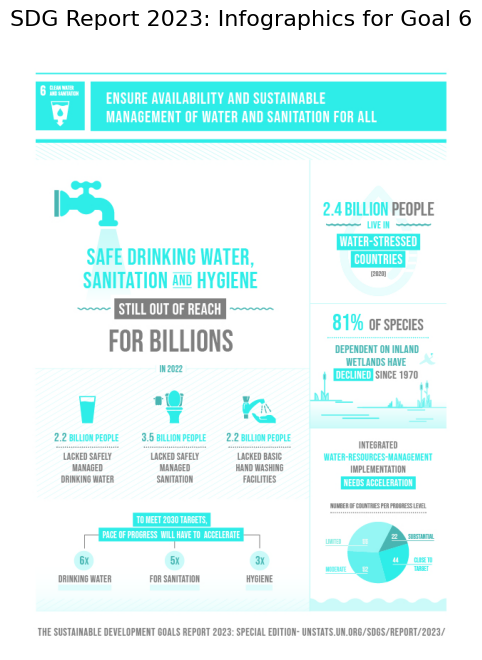

In [1]:
from PIL import Image as PILImage
import matplotlib.pyplot as plt

image_path = r"C:\Users\Lokesh Patra\Documents\Projects\SDG6\SDG_report_2023_infographics_Goal 6.jpg"

img = PILImage.open(image_path)

fig, ax = plt.subplots(figsize=(10, 8))
ax.imshow(img)
ax.set_title("SDG Report 2023: Infographics for Goal 6", fontsize=16, loc='center')
ax.axis('off')

plt.show()

- - -

<div style="background-color:#000000; color:#FFA500; font-family:Times New Roman, Times, serif; font-size:50px;">
    <center>Feature Description</center>
</div>

1. **ph**: pH of 1. water (0 to 14).

2. **Hardness**: Capacity of water to precipitate soap in mg/L.

3. **Solids**: Total dissolved solids in ppm.

4. **Chloramines**: Amount of Chloramines in ppm.

5. **Sulfate**: Amount of Sulfates dissolved in mg/L.

6. **Conductivity**: Electrical conductivity of water in μS/cm.

7. **Organic_carbon**: Amount of organic carbon in ppm.

8. **Trihalomethanes**: Amount of Trihalomethanes in μg/L.

9. **Turbidity**: Measure of light emiting property of water in NTU.

10. **Potability**: Indicates if water is safe for human consumption. Potable - 1 and Not potable - 0

---

<div style="background-color:#000000; color:#FFA500; font-family:Times New Roman, Times, serif; font-size:50px;">
    <center>Libraries</center>
</div>

In [2]:
# Basic Libraries
import numpy as np
import pandas as pd
from warnings import filterwarnings
from collections import Counter

# Visualization Libraries
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.offline as pyo
import plotly.express as px
import plotly.graph_objs as go
import plotly.figure_factory as ff
import missingno as msno

# Data Pre-processing Libraries
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split

# Modelling Libraries
from sklearn.linear_model import (
    LogisticRegression, RidgeClassifier, SGDClassifier, PassiveAggressiveClassifier, Perceptron
)
from sklearn.svm import SVC, LinearSVC, NuSVC
from sklearn.neighbors import KNeighborsClassifier, NearestCentroid
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import (
    RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, VotingClassifier
)
from sklearn.naive_bayes import GaussianNB, BernoulliNB

# Evaluation & CV Libraries
from sklearn.metrics import (precision_score, recall_score, f1_score, accuracy_score, classification_report, 
    confusion_matrix, roc_curve, auc)
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV, RepeatedStratifiedKFold

# Initialize Plotly
pyo.init_notebook_mode()

# Suppress warnings
filterwarnings('ignore')

---

<div style="background-color:#000000; color:#FFA500; font-family:Times New Roman, Times, serif; font-size:50px;">
    <center>Colors</center>
</div>

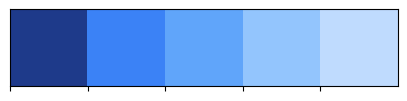

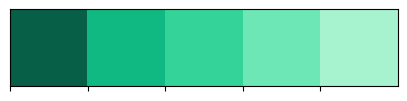

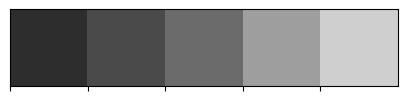

In [3]:
colors_blue = ["#1E3A8A", "#3B82F6", "#60A5FA", "#93C5FD", "#BFDBFE"]
colors_dark = ["#2D2D2D", "#4A4A4A", "#6B6B6B", "#9E9E9E", "#CFCFCF"]
colors_green = ["#065F46", "#10B981", "#34D399", "#6EE7B7", "#A7F3D0"]

sns.palplot(colors_blue)
sns.palplot(colors_green)
sns.palplot(colors_dark)

---

<div style="background-color:#000000; color:#FFA500; font-family:Times New Roman, Times, serif; font-size:50px;">
    <center>Importing The Dataset</center>
</div>

In [4]:
df = pd.read_csv(r"C:\Users\Lokesh Patra\Documents\Data Science\water_potability.csv")

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3276 entries, 0 to 3275
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ph               2785 non-null   float64
 1   Hardness         3276 non-null   float64
 2   Solids           3276 non-null   float64
 3   Chloramines      3276 non-null   float64
 4   Sulfate          2495 non-null   float64
 5   Conductivity     3276 non-null   float64
 6   Organic_carbon   3276 non-null   float64
 7   Trihalomethanes  3114 non-null   float64
 8   Turbidity        3276 non-null   float64
 9   Potability       3276 non-null   int64  
dtypes: float64(9), int64(1)
memory usage: 256.1 KB


In [6]:
df.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,NaN,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.057858,6.635246,NaN,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.541732,9.275884,NaN,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0


---

<div style="background-color:#000000; color:#FFA500; font-family:Times New Roman, Times, serif; font-size:50px;">
    <center>Visualizations</center>
</div>

In [7]:
import pandas as pd
import plotly.express as px

# Assuming df is your original DataFrame
d = df['Potability'].value_counts().reset_index()
d.columns = ['Potability', 'count']

fig = px.pie(d, values='count', names='Potability', hole=0.4,
             color_discrete_sequence=px.colors.qualitative.Set3,  # Changed color sequence
             labels={'Potability': 'Potability', 'count': 'No. Of Samples'})

fig.add_annotation(text=' ',
                   x=1.2, y=0.9, showarrow=False, font_size=12, opacity=0.7)

fig.update_layout(
    title=dict(text='% (Samples of water are Potable)', x=0.5, y=0.95,
               font=dict(size=20)),
    legend=dict(x=0.5, y=-0.1, orientation='h', traceorder='reversed'),
    hoverlabel=dict(bgcolor='white'),
    font_family='monospace'
)

fig.update_traces(textposition='outside', textinfo='percent+label')

fig.show()

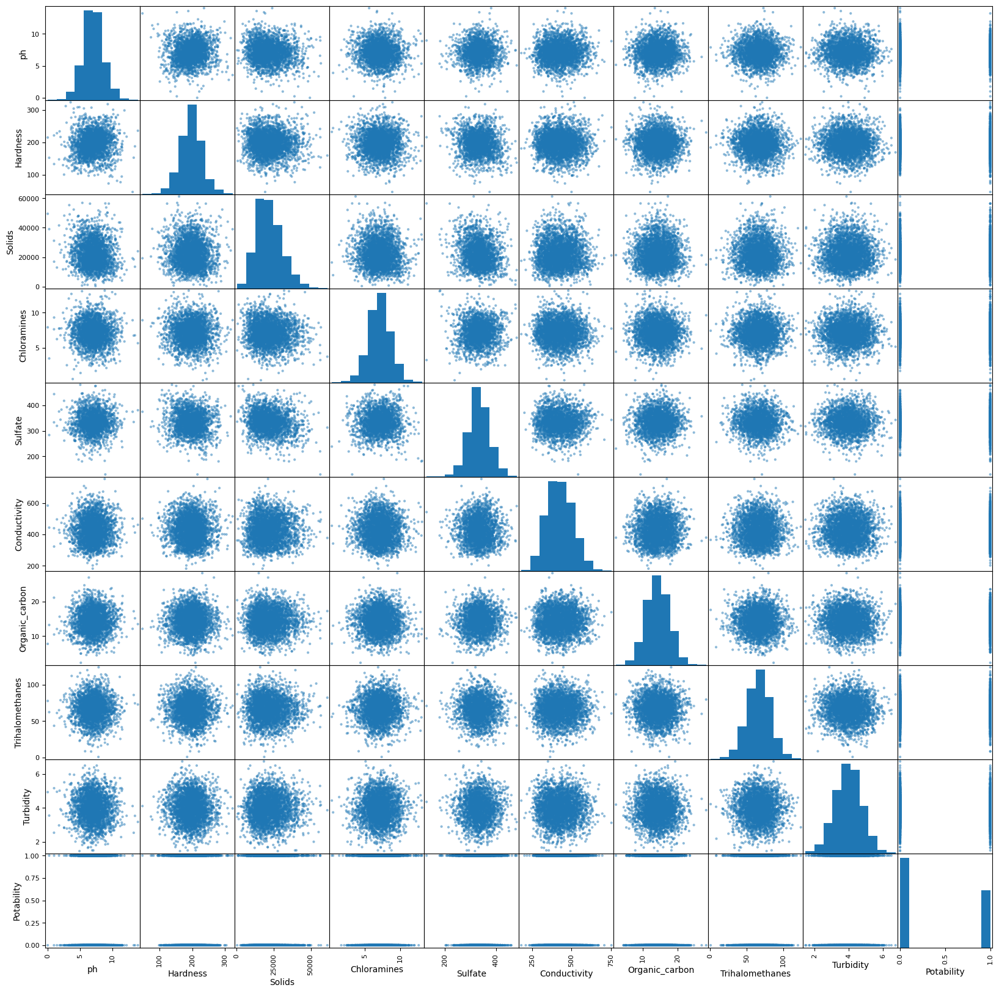

In [8]:
from pandas.plotting import scatter_matrix 
scatter_matrix(df, figsize = (20, 20));

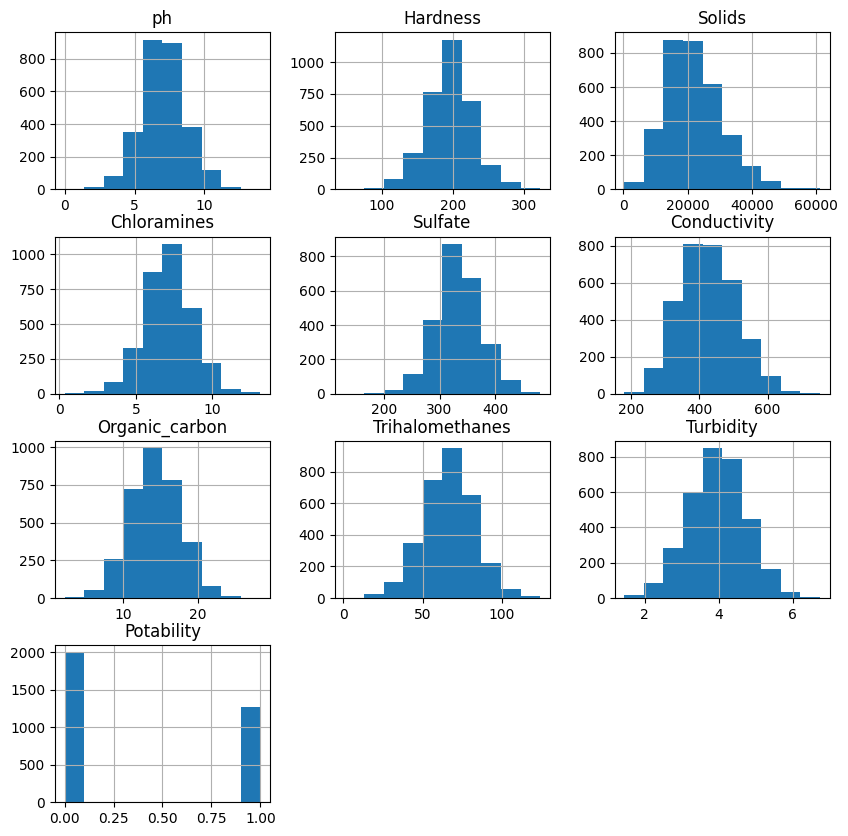

In [9]:
# Histogram of each feature 
df.hist(bins=10,figsize=(10,10)) 
plt.show()

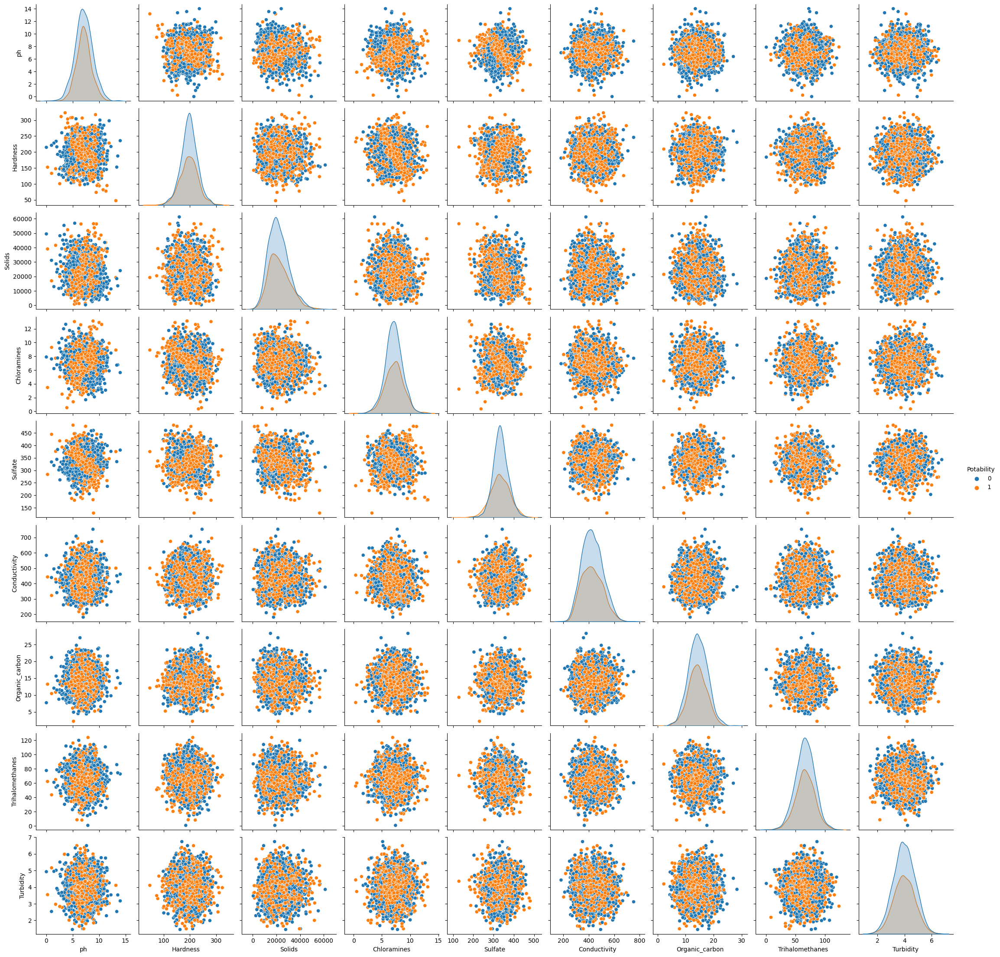

In [10]:
# Pairplot

sns.pairplot(data = df, hue = 'Potability') 
plt.show()

Let's check out the distribution of the features.

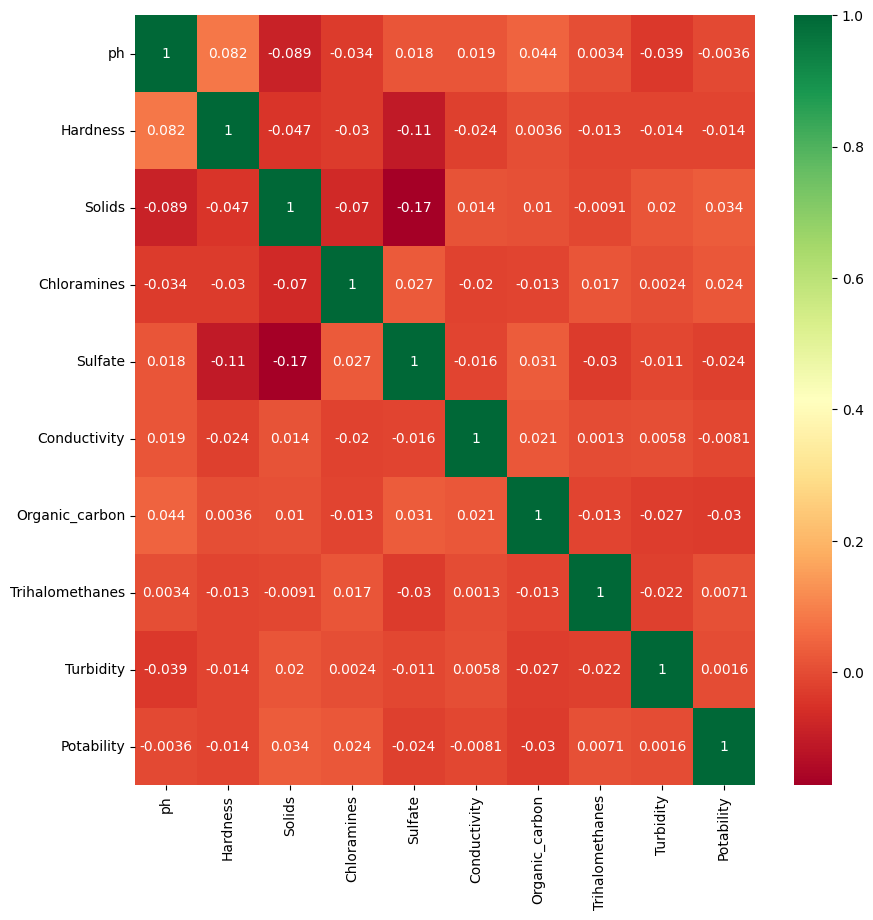

In [11]:
import seaborn as sns

#get correlations of each features in dataset 
corrmat = df.corr() 
top_corr_features = corrmat.index 
plt.figure(figsize=(10,10)) 
#plot heat map 
g=sns.heatmap(df[top_corr_features].corr(),annot=True,cmap="RdYlGn")

<div style="background-color:#000000; color:#FFA500; font-family:Times New Roman, Times, serif; font-size:50px;">
    <center>Feature Descriptions</center>
</div>

**Hardenss of water**: The simple definition of water hardness is the amount of dissolved calcium and magnesium in the water. Hard water is high in dissolved minerals, largely calcium and magnesium. You may have felt the effects of hard water, literally, the last time you washed your hands. Depending on the hardness of your water, after using soap to wash you may have felt like there was a film of residue left on your hands. In hard water, soap reacts with the calcium (which is relatively high in hard water) to form "soap scum". When using hard water, more soap or detergent is needed to get things clean, be it your hands, hair, or your laundry.

In [12]:
import pandas as pd
import plotly.express as px
from collections import Counter

# Assuming df is your original DataFrame
fig = px.histogram(df, x='Hardness', color='Potability', template='plotly_white',
                   marginal='box', opacity=0.7, nbins=100,
                   color_discrete_sequence=[colors_green[3], colors_blue[3]],
                   barmode='group', histfunc='count')

fig.add_vline(x=151, line_width=1, line_color=colors_dark[1], line_dash='dot', opacity=0.7)
fig.add_vline(x=301, line_width=1, line_color=colors_dark[1], line_dash='dot', opacity=0.7)
fig.add_vline(x=76, line_width=1, line_color=colors_dark[1], line_dash='dot', opacity=0.7)

fig.add_annotation(text='<76 mg/L is<br> considered soft', x=40, y=130, showarrow=False, font_size=9)
fig.add_annotation(text='Between 76 and 150<br> (mg/L) is<br>moderately hard', x=113, y=130, showarrow=False, font_size=9)
fig.add_annotation(text='Between 151 and 300 (mg/L)<br> is considered hard', x=250, y=130, showarrow=False, font_size=9)
fig.add_annotation(text='>300 mg/L is<br> considered very hard', x=340, y=130, showarrow=False, font_size=9)

fig.update_layout(
    font_family='monospace',
    title=dict(text='Hardness Distribution', x=0.53, y=0.95,
               font=dict(color=colors_dark[2], size=20)),
    xaxis_title_text='Hardness (mg/L)',
    yaxis_title_text='Count',
    legend=dict(x=1, y=0.96, bordercolor=colors_dark[4], borderwidth=0, tracegroupgap=5),
    bargap=0.3,
)

fig.show()

**pH level:** The  pH  of  water  is  a  measure  of  the  acid–base  equilibrium  and,  in  most  natural  waters,   is   controlled   by   the   carbon   dioxide–bicarbonate–carbonate   equilibrium   system. An increased carbon dioxide concentration will therefore lower pH, whereas a decrease will cause it to rise. Temperature will also affect the equilibria and the pH. In pure  water,  a  decrease  in  pH  of  about  0.45  occurs  as  the  temperature  is  raised  by  25  °C.  In  water  with  a  buffering  capacity  imparted  by  bicarbonate,  carbonate  and  hydroxyl  ions,  this  temperature  effect  is  modified  (APHA,  1989).  The  pH  of  most  drinking-water lies within the range 6.5–8.5. Natural waters can be of lower pH, as a result of, for example, acid rain or higher pH in limestone areas.

In [13]:
import pandas as pd
import plotly.express as px

# Assuming df is your original DataFrame
fig = px.histogram(df, x='ph', color='Potability', template='plotly_white',
                   marginal='box', opacity=0.7, nbins=100,
                   color_discrete_sequence=[colors_green[3], colors_blue[3]],
                   barmode='group', histfunc='count')

fig.add_vline(x=7, line_width=1, line_color=colors_dark[1], line_dash='dot', opacity=0.7)

fig.add_annotation(text='<7 is Acidic', x=4, y=70, showarrow=False, font_size=10)
fig.add_annotation(text='>7 is Basic', x=10, y=70, showarrow=False, font_size=10)

fig.update_layout(
    font_family='monospace',
    title=dict(text='pH Level Distribution', x=0.5, y=0.95,
               font=dict(color=colors_dark[2], size=20)),
    xaxis_title_text='pH Level',
    yaxis_title_text='Count',
    legend=dict(x=1, y=0.96, bordercolor=colors_dark[4], borderwidth=1, tracegroupgap=5),
    bargap=0.3,
)

fig.show()

**TDS**: TDS means concentration of dissolved particles or solids in water. TDS comprises of inorganic salts such as calcium, magnesium, chlorides, sulfates, bicarbonates, etc, along with many more inorganic compounds that easily dissolve in water. 

In [14]:
import pandas as pd
import plotly.express as px

# Assuming df is your original DataFrame
fig = px.histogram(df, x='Solids', color='Potability', template='plotly_white',
                   marginal='box', opacity=0.7, nbins=100,
                   color_discrete_sequence=[colors_green[3], colors_blue[3]],
                   barmode='group', histfunc='count')

fig.update_layout(
    font_family='monospace',
    title=dict(text='Distribution Of Total Dissolved Solids', x=0.5, y=0.95,
               font=dict(color=colors_dark[2], size=20)),
    xaxis_title_text='Dissolved Solids (ppm)',
    yaxis_title_text='Count',
    legend=dict(x=1, y=0.96, bordercolor=colors_dark[4], borderwidth=1, tracegroupgap=5),
    bargap=0.3,
)

fig.show()

**Chloramines**: Chloramines (also known as secondary disinfection) are disinfectants used to treat drinking water and they:

* Are most commonly formed when ammonia is added to chlorine to treat drinking water.
* Provide longer-lasting disinfection as the water moves through pipes to consumers.

Chloramines have been used by water utilities since the 1930s.

In [15]:
import pandas as pd
import plotly.express as px

# Assuming df is your original DataFrame
fig = px.histogram(df, x='Chloramines', color='Potability', template='plotly_white',
                   marginal='box', opacity=0.7, nbins=100,
                   color_discrete_sequence=[colors_green[3], colors_blue[3]],
                   barmode='group', histfunc='count')

fig.add_vline(x=4, line_width=1, line_color=colors_dark[1], line_dash='dot', opacity=0.7)

fig.add_annotation(text='<4 ppm is considered<br> safe for drinking', x=1.8, y=90, showarrow=False)

fig.update_layout(
    font_family='monospace',
    title=dict(text='Chloramines Distribution', x=0.53, y=0.95,
               font=dict(color=colors_dark[2], size=20)),
    xaxis_title_text='Chloramines (ppm)',
    yaxis_title_text='Count',
    legend=dict(x=1, y=0.96, bordercolor=colors_dark[4], borderwidth=1, tracegroupgap=5),
    bargap=0.3,
)

fig.show()

**Sulfate**: Sulfate (SO4) can be found in almost all natural water. The origin of most sulfate compounds is the oxidation of sulfite ores, the presence of shales, or the industrial wastes.
Sulfate is one of the major dissolved components of rain. High concentrations of sulfate in the water we drink can have a laxative effect when combined with calcium and magnesium, the two most common constituents of hardness.

In [16]:
import pandas as pd
import plotly.express as px

# Assuming df is your original DataFrame
fig = px.histogram(df, x='Sulfate', color='Potability', template='plotly_white',
                   marginal='box', opacity=0.7, nbins=100,
                   color_discrete_sequence=[colors_green[3], colors_blue[3]],
                   barmode='group', histfunc='count')

fig.add_vline(x=250, line_width=1, line_color=colors_dark[1], line_dash='dot', opacity=0.7)

fig.add_annotation(text='<250 mg/L is considered<br> safe for drinking', x=175, y=90, showarrow=False)

fig.update_layout(
    font_family='monospace',
    title=dict(text='Sulfate Distribution', x=0.53, y=0.95,
               font=dict(color=colors_dark[2], size=20)),
    xaxis_title_text='Sulfate (mg/L)',
    yaxis_title_text='Count',
    legend=dict(x=1, y=0.96, bordercolor=colors_dark[4], borderwidth=1, tracegroupgap=5),
    bargap=0.3,
)

fig.show()

**Conductivity**: Conductivity is a measure of the ability of water to pass an electrical current. Because dissolved salts and other inorganic chemicals conduct electrical current, conductivity increases as salinity increases. Organic compounds like oil do not conduct electrical current very well and therefore have a low conductivity when in water. Conductivity is also affected by temperature: the warmer the water, the higher the conductivity.

In [17]:
fig = px.histogram(df,x='Conductivity',y=Counter(df['Conductivity']),color='Potability',template='plotly_white',
                  marginal='box',opacity=0.7,nbins=100,color_discrete_sequence=[colors_green[3],colors_blue[3]],
                  barmode='group',histfunc='count')

fig.add_annotation(text='The Conductivity range <br> is safe for both (200-800),<br> Potable and Non-Potable water',
                   x=600,y=90,showarrow=False)

fig.update_layout(
    font_family='monospace',
    title=dict(text='Conductivity Distribution',x=0.5,y=0.95,
               font=dict(color=colors_dark[2],size=20)),
    xaxis_title_text='Conductivity (μS/cm)',
    yaxis_title_text='Count',
    legend=dict(x=1,y=0.96,bordercolor=colors_dark[4],borderwidth=0,tracegroupgap=5),
    bargap=0.3,
)
fig.show()

**Organic Carbon**: Organic contaminants (natural organic substances, insecticides, herbicides, and other agricultural chemicals) enter waterways in rainfall runoff. Domestic and industrial wastewaters also contribute organic contaminants in various amounts. As a result of accidental spills or leaks, industrial organic wastes may enter streams. Some of the contaminants may not be completely removed by treatment processes; therefore, they could become a problem for drinking water sources. It is important to know the organic content in a waterway.

In [18]:
fig = px.histogram(df,x='Organic_carbon',y=Counter(df['Organic_carbon']),color='Potability',template='plotly_white',
                  marginal='box',opacity=0.7,nbins=100,color_discrete_sequence=[colors_green[3],colors_blue[3]],
                  barmode='group',histfunc='count')

fig.add_vline(x=10, line_width=1, line_color=colors_dark[1],line_dash='dot',opacity=0.7)

fig.add_annotation(text='Typical Organic Carbon<br> level is upto 10 ppm',x=5.3,y=110,showarrow=False)

fig.update_layout(
    font_family='monospace',
    title=dict(text='Organic Carbon Distribution',x=0.5,y=0.95,
               font=dict(color=colors_dark[2],size=20)),
    xaxis_title_text='Organic Carbon (ppm)',
    yaxis_title_text='Count',
    legend=dict(x=1,y=0.96,bordercolor=colors_dark[4],borderwidth=0,tracegroupgap=5),
    bargap=0.3,
)
fig.show()

**Trihalomethanes**: Trihalomethanes (THMs) are the result of a reaction between the chlorine used for disinfecting tap water and natural organic matter in the water. At elevated levels, THMs have been associated with negative health effects such as cancer and adverse reproductive outcomes.

In [19]:
import pandas as pd
import plotly.express as px

# Assuming df is your original DataFrame
fig = px.histogram(df, x='Trihalomethanes', color='Potability', template='plotly_white',
                   marginal='box', opacity=0.7, nbins=100,
                   color_discrete_sequence=[colors_green[3], colors_blue[3]],
                   barmode='group', histfunc='count')

fig.add_vline(x=80, line_width=1, line_color=colors_dark[1], line_dash='dot', opacity=0.7)

fig.add_annotation(text='Upper limit of Trihalomethanes<br> level is 80 μg/L', x=115, y=90, showarrow=False)

fig.update_layout(
    font_family='monospace',
    title=dict(text='Trihalomethanes Distribution', x=0.5, y=0.95,
               font=dict(color=colors_dark[2], size=20)),
    xaxis_title_text='Trihalomethanes (μg/L)',
    yaxis_title_text='Count',
    legend=dict(x=1, y=0.96, bordercolor=colors_dark[4], borderwidth=1, tracegroupgap=5),
    bargap=0.3,
)

fig.show()

**Turbidity**: Turbidity is the measure of relative clarity of a liquid. It is an optical characteristic of water and is a measurement of the amount of light that is scattered by material in the water when a light is shined through the water sample. The higher the intensity of scattered light, the higher the turbidity. Material that causes water to be turbid include clay, silt, very tiny inorganic and organic matter, algae, dissolved colored organic compounds, and plankton and other microscopic organisms.

In [20]:
fig = px.histogram(df,x='Turbidity',y=Counter(df['Turbidity']),color='Potability',template='plotly_white',
                  marginal='box',opacity=0.7,nbins=100,color_discrete_sequence=[colors_green[3],colors_blue[3]],
                  barmode='group',histfunc='count')

fig.add_vline(x=5, line_width=1, line_color=colors_dark[1],line_dash='dot',opacity=0.7)

fig.add_annotation(text='<5 NTU Turbidity is<br> considered safe',x=6,y=90,showarrow=False)

fig.update_layout(
    font_family='monospace',
    title=dict(text='Turbidity Distribution',x=0.5,y=0.95,
               font=dict(color=colors_dark[2],size=20)),
    xaxis_title_text='Turbidity (NTU)',
    yaxis_title_text='Count',
    legend=dict(x=1,y=0.96,bordercolor=colors_dark[4],borderwidth=0,tracegroupgap=5),
    bargap=0.3,
)
fig.show()

In [21]:
# importing sweetviz #pip install sweetviz
import sweetviz as sv

#analyzing the dataset
water_report = sv.analyze(df)
#display the report

water_report.show_html('water.html')

                                             |                                             | [  0%]   00:00 ->…

Report water.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


Scatter Plot Matrix helps in finding out the correlation between all the features.

In [22]:
fig = px.scatter_matrix(df,df.drop('Potability',axis=1),height=1250,width=1250,template='plotly_white',opacity=0.7,
                        color_discrete_sequence=[colors_blue[3],colors_green[3]],color='Potability',
                       symbol='Potability',color_continuous_scale=[colors_green[3],colors_blue[3]])

fig.update_layout(font_family='monospace',font_size=10,
                  coloraxis_showscale=False,
                 legend=dict(x=0.02,y=1.07,bgcolor=colors_dark[4]),
                 title=dict(text='Scatter Plot Matrix b/w Features',x=0.5,y=0.97,
                   font=dict(color=colors_dark[2],size=24)))
fig.show()

As we can see, there seems to be very less correlation between all the features.

In [23]:
cor=df.drop('Potability',axis=1).corr()
cor

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity
ph,1.000000,0.082096,-0.089288,-0.034350,0.018203,0.018614,0.043503,0.003354,-0.039057
Hardness,0.082096,1.000000,-0.046899,-0.030054,-0.106923,-0.023915,0.003610,-0.013013,-0.014449
Solids,-0.089288,-0.046899,1.000000,-0.070148,-0.171804,0.013831,0.010242,-0.009143,0.019546
Chloramines,-0.034350,-0.030054,-0.070148,1.000000,0.027244,-0.020486,-0.012653,0.017084,0.002363
Sulfate,0.018203,-0.106923,-0.171804,0.027244,1.000000,-0.016121,0.030831,-0.030274,-0.011187
Conductivity,0.018614,-0.023915,0.013831,-0.020486,-0.016121,1.000000,0.020966,0.001285,0.005798
Organic_carbon,0.043503,0.003610,0.010242,-0.012653,0.030831,0.020966,1.000000,-0.013274,-0.027308
Trihalomethanes,0.003354,-0.013013,-0.009143,0.017084,-0.030274,0.001285,-0.013274,1.000000,-0.022145
Turbidity,-0.039057,-0.014449,0.019546,0.002363,-0.011187,0.005798,-0.027308,-0.022145,1.000000


Let's make a Heatmap to visualize the correlation.

In [24]:
fig = px.imshow(cor,height=800,width=800,color_continuous_scale=colors_blue,template='plotly_white')

fig.update_layout(font_family='monospace',
                title=dict(text='Correlation Heatmap',x=0.5,y=0.93,
                             font=dict(color=colors_dark[2],size=24)),
                coloraxis_colorbar=dict(len=0.85,x=1.1) 
                 )

fig.show()

---

<div style="background-color:#000000; color:#FFA500; font-family:Times New Roman, Times, serif; font-size:20px;">
    <center>Data Preparation</center>
</div>

<div style="background-color:#000000; color:#FFA500; font-family:Times New Roman, Times, serif; font-size:50px;">
    <center>Dealing With Missing Values</center>
</div>

In [25]:
df.isnull().sum()

ph                 491
Hardness             0
Solids               0
Chloramines          0
Sulfate            781
Conductivity         0
Organic_carbon       0
Trihalomethanes    162
Turbidity            0
Potability           0
dtype: int64

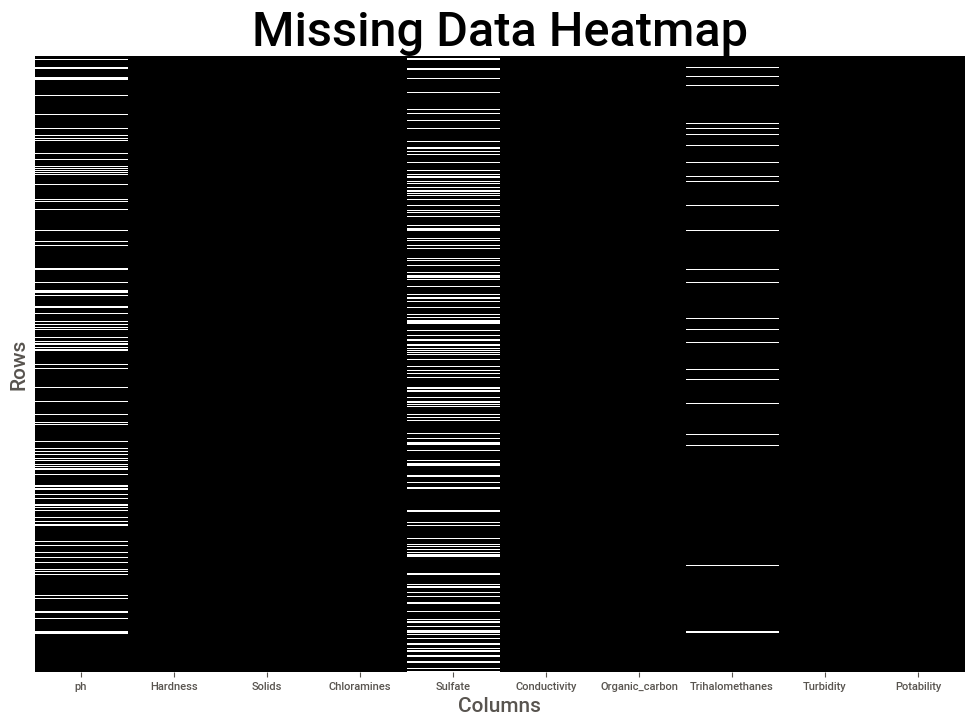

In [26]:
# Create a boolean DataFrame indicating missing values
missing_data = df.isnull()

# Create a heatmap of the missing data
plt.figure(figsize=(12, 8))
sns.heatmap(missing_data, cmap="gnuplot2", cbar=False, yticklabels=False)
plt.title('Missing Data Heatmap', fontsize=35)
plt.xlabel('Columns', fontsize=15)
plt.ylabel('Rows', fontsize=15)
plt.show()

In [27]:
df[df['Potability']==0].describe()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
count,1684.000000,1998.000000,1998.000000,1998.000000,1510.000000,1998.000000,1998.000000,1891.000000,1998.000000,1998.0
mean,7.085378,196.733292,21777.490788,7.092175,334.564290,426.730454,14.364335,66.303555,3.965800,0.0
std,1.683499,31.057540,8543.068788,1.501045,36.745549,80.047317,3.334554,16.079320,0.780282,0.0
min,0.000000,98.452931,320.942611,1.683993,203.444521,181.483754,4.371899,0.738000,1.450000,0.0
25%,6.037723,177.823265,15663.057382,6.155640,311.264006,368.498530,12.101057,55.706530,3.444062,0.0
50%,7.035456,197.123423,20809.618280,7.090334,333.389426,422.229331,14.293508,66.542198,3.948076,0.0
75%,8.155510,216.120687,27006.249009,8.066462,356.853897,480.677198,16.649485,77.277704,4.496106,0.0
max,14.000000,304.235912,61227.196008,12.653362,460.107069,753.342620,28.300000,120.030077,6.739000,0.0


In [28]:
df[df['Potability']==1].describe()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
count,1101.000000,1278.000000,1278.000000,1278.000000,985.000000,1278.000000,1278.000000,1223.000000,1278.000000,1278.0
mean,7.073783,195.800744,22383.991018,7.169338,332.566990,425.383800,14.160893,66.539684,3.968328,1.0
std,1.448048,35.547041,9101.010208,1.702988,47.692818,82.048446,3.263907,16.327419,0.780842,0.0
min,0.227499,47.432000,728.750830,0.352000,129.000000,201.619737,2.200000,8.175876,1.492207,1.0
25%,6.179312,174.330531,15668.985035,6.094134,300.763772,360.939023,12.033897,56.014249,3.430909,1.0
50%,7.036752,196.632907,21199.386614,7.215163,331.838167,420.712729,14.162809,66.678214,3.958576,1.0
75%,7.933068,218.003420,27973.236446,8.199261,365.941346,484.155911,16.356245,77.380975,4.509569,1.0
max,13.175402,323.124000,56488.672413,13.127000,481.030642,695.369528,23.604298,124.000000,6.494249,1.0


In [29]:
df[df['Potability']==0][['ph','Sulfate','Trihalomethanes']].median()

ph                   7.035456
Sulfate            333.389426
Trihalomethanes     66.542198
dtype: float64

In [30]:
df[df['Potability']==1][['ph','Sulfate','Trihalomethanes']].median()

ph                   7.036752
Sulfate            331.838167
Trihalomethanes     66.678214
dtype: float64

We can see that the difference between the mean and median values of Potable and Non-Potable Water is minimal.
So we use the overall median of the feature to impute the values

In [31]:
df['ph'].fillna(value=df['ph'].median(),inplace=True)
df['Sulfate'].fillna(value=df['Sulfate'].median(),inplace=True)
df['Trihalomethanes'].fillna(value=df['Trihalomethanes'].median(),inplace=True)

In [32]:
df.isnull().sum()

ph                 0
Hardness           0
Solids             0
Chloramines        0
Sulfate            0
Conductivity       0
Organic_carbon     0
Trihalomethanes    0
Turbidity          0
Potability         0
dtype: int64

<div style="background-color:#000000; color:#FFA500; font-family:Times New Roman, Times, serif; font-size:50px;">
    <center>Standardizing The Data</center>
</div>

In [33]:
X = df.drop('Potability',axis=1).values
y = df['Potability'].values

In [34]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

In [35]:
scaler = StandardScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

---

<div style="background-color:#000700; color:#AFA585; font-family:Times New Roman, Times, serif; font-size:30px;">
    <center>Modelling</center>
</div>

<div style="background-color:#000000; color:#FFA500; font-family:Times New Roman, Times, serif; font-size:50px;">
    <center>Spot Checking</center>
</div>

Spot checking is a great method to find out the baseline models for our data. It's quite easy and takes really less time.

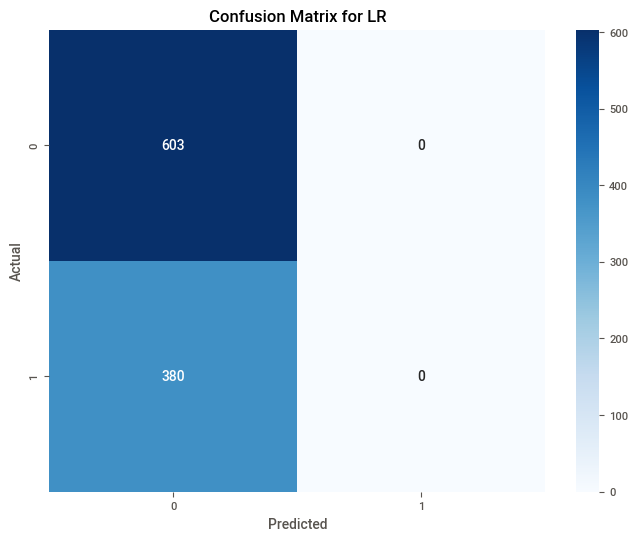

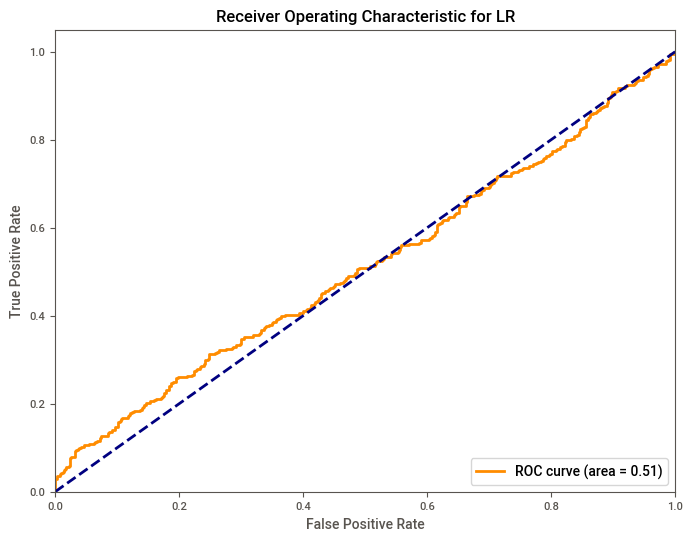

Classification Report for LR:

              precision    recall  f1-score   support

           0       0.61      1.00      0.76       603
           1       0.00      0.00      0.00       380

    accuracy                           0.61       983
   macro avg       0.31      0.50      0.38       983
weighted avg       0.38      0.61      0.47       983





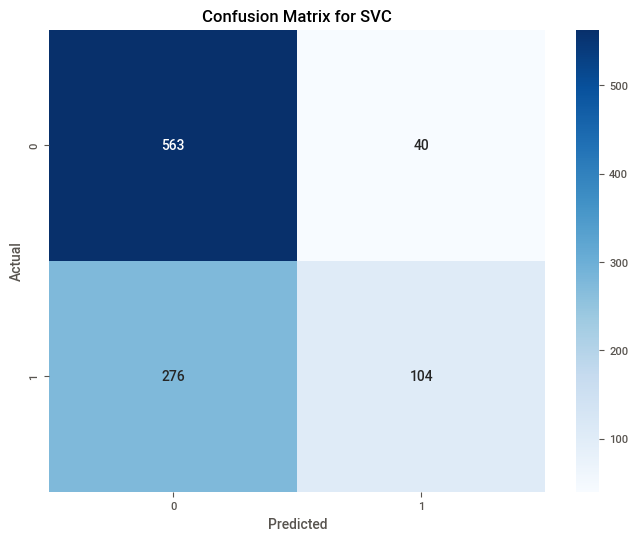

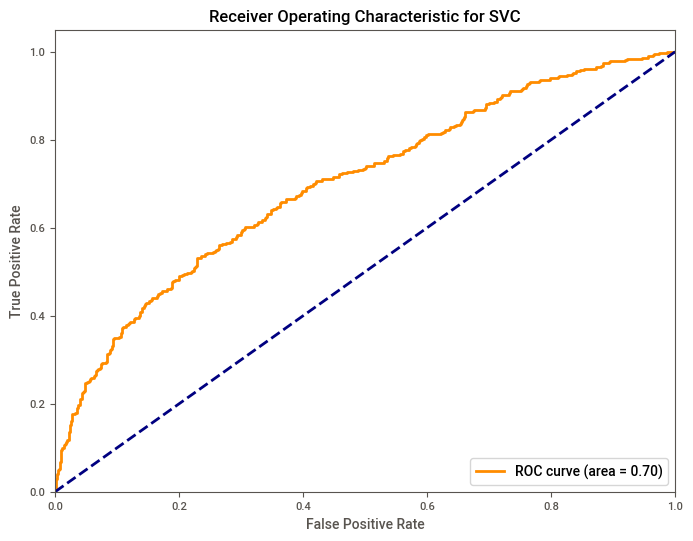

Classification Report for SVC:

              precision    recall  f1-score   support

           0       0.67      0.93      0.78       603
           1       0.72      0.27      0.40       380

    accuracy                           0.68       983
   macro avg       0.70      0.60      0.59       983
weighted avg       0.69      0.68      0.63       983





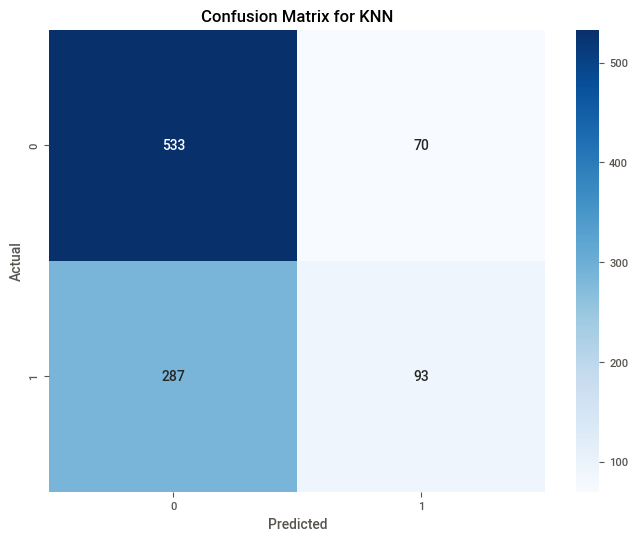

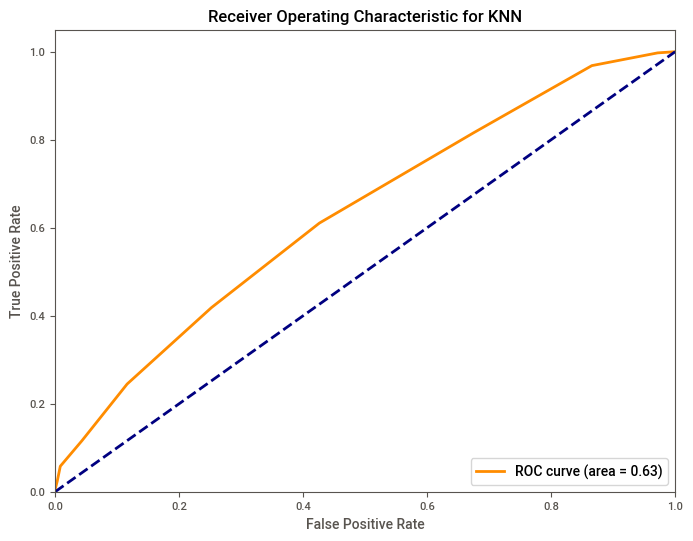

Classification Report for KNN:

              precision    recall  f1-score   support

           0       0.65      0.88      0.75       603
           1       0.57      0.24      0.34       380

    accuracy                           0.64       983
   macro avg       0.61      0.56      0.55       983
weighted avg       0.62      0.64      0.59       983





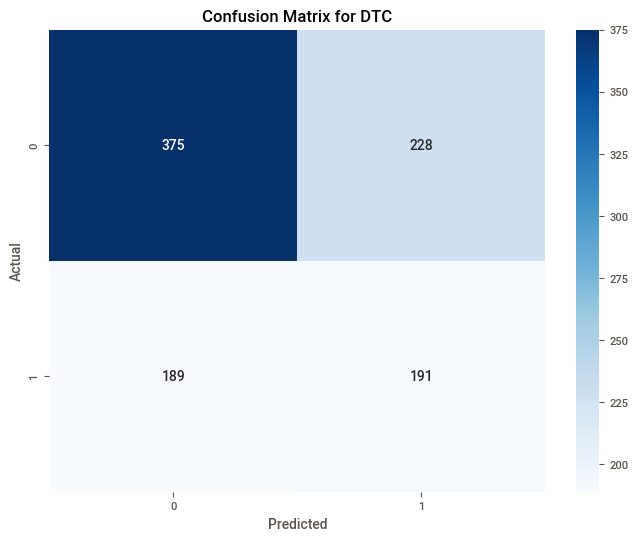

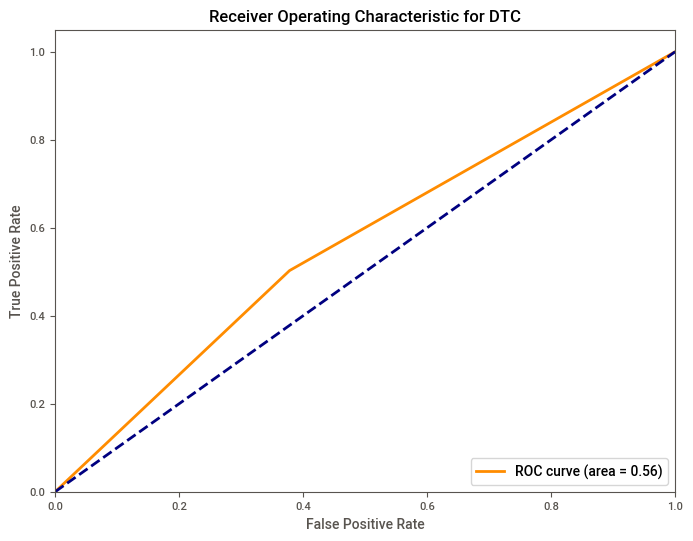

Classification Report for DTC:

              precision    recall  f1-score   support

           0       0.66      0.62      0.64       603
           1       0.46      0.50      0.48       380

    accuracy                           0.58       983
   macro avg       0.56      0.56      0.56       983
weighted avg       0.58      0.58      0.58       983





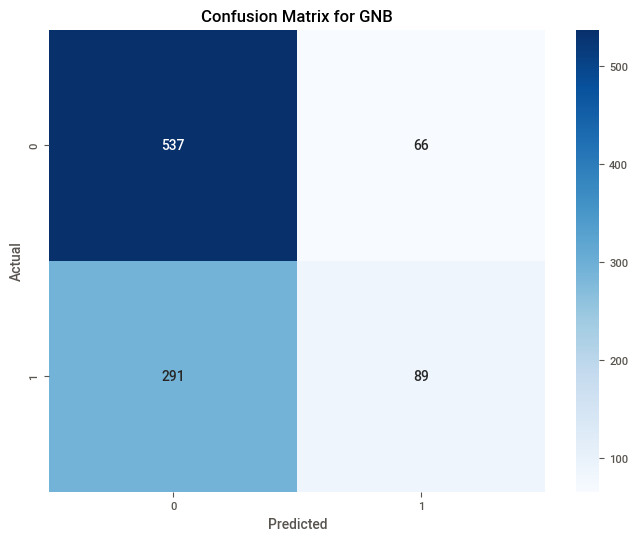

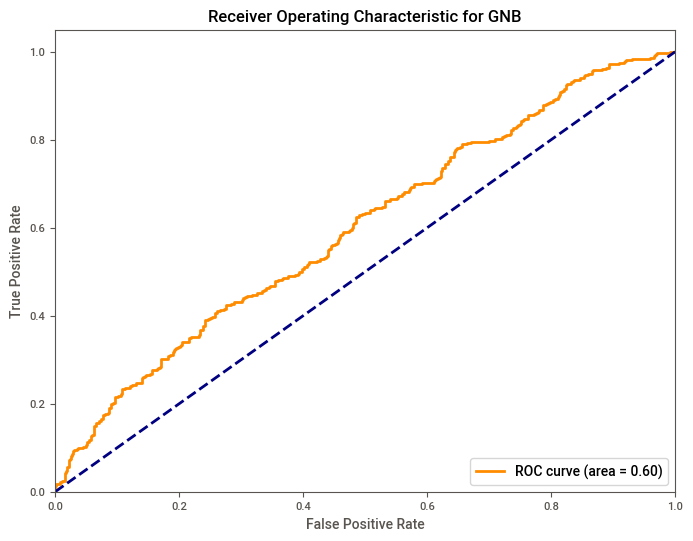

Classification Report for GNB:

              precision    recall  f1-score   support

           0       0.65      0.89      0.75       603
           1       0.57      0.23      0.33       380

    accuracy                           0.64       983
   macro avg       0.61      0.56      0.54       983
weighted avg       0.62      0.64      0.59       983





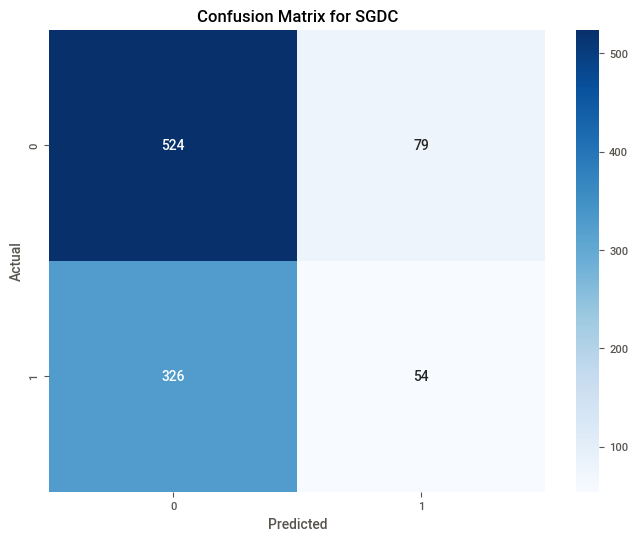

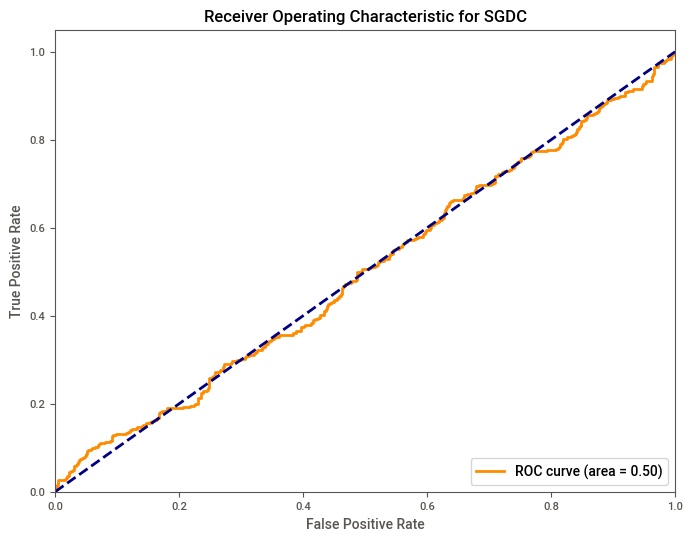

Classification Report for SGDC:

              precision    recall  f1-score   support

           0       0.62      0.87      0.72       603
           1       0.41      0.14      0.21       380

    accuracy                           0.59       983
   macro avg       0.51      0.51      0.47       983
weighted avg       0.54      0.59      0.52       983





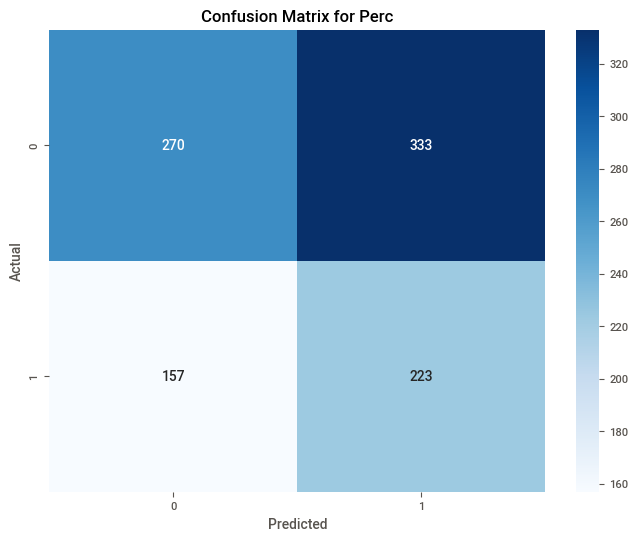

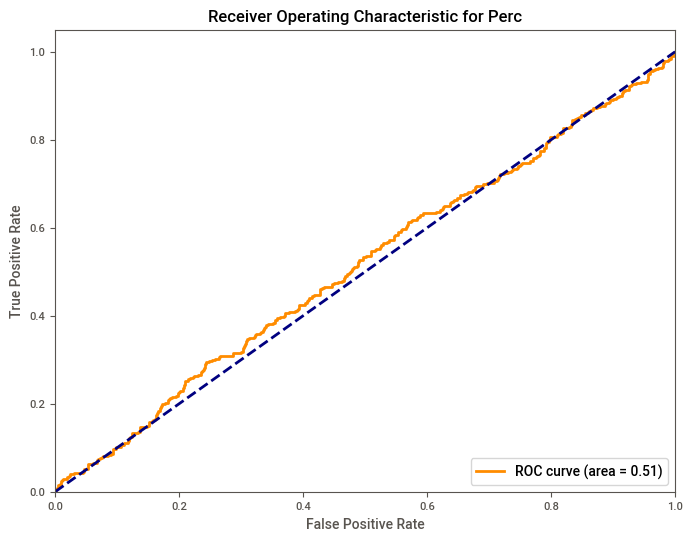

Classification Report for Perc:

              precision    recall  f1-score   support

           0       0.63      0.45      0.52       603
           1       0.40      0.59      0.48       380

    accuracy                           0.50       983
   macro avg       0.52      0.52      0.50       983
weighted avg       0.54      0.50      0.51       983





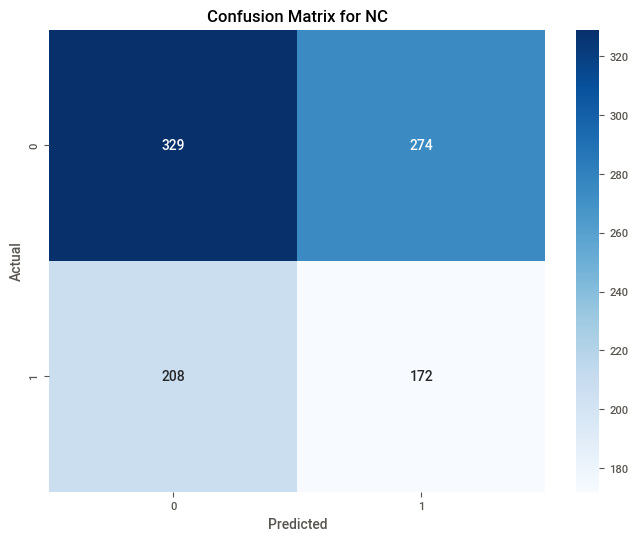

ROC curve not available for NC
Classification Report for NC:

              precision    recall  f1-score   support

           0       0.61      0.55      0.58       603
           1       0.39      0.45      0.42       380

    accuracy                           0.51       983
   macro avg       0.50      0.50      0.50       983
weighted avg       0.52      0.51      0.52       983





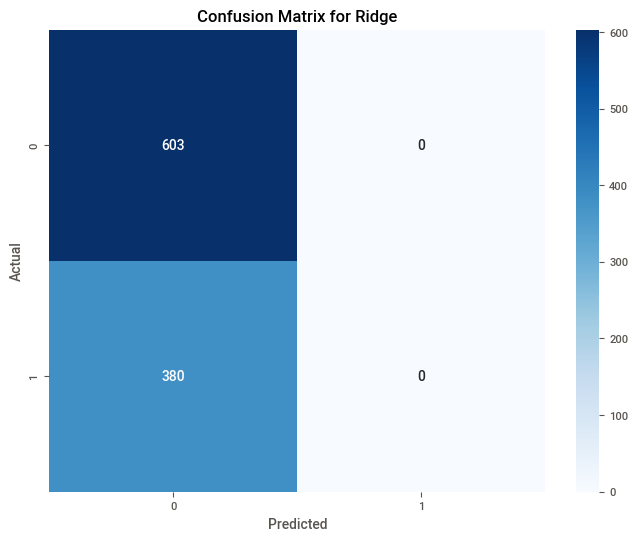

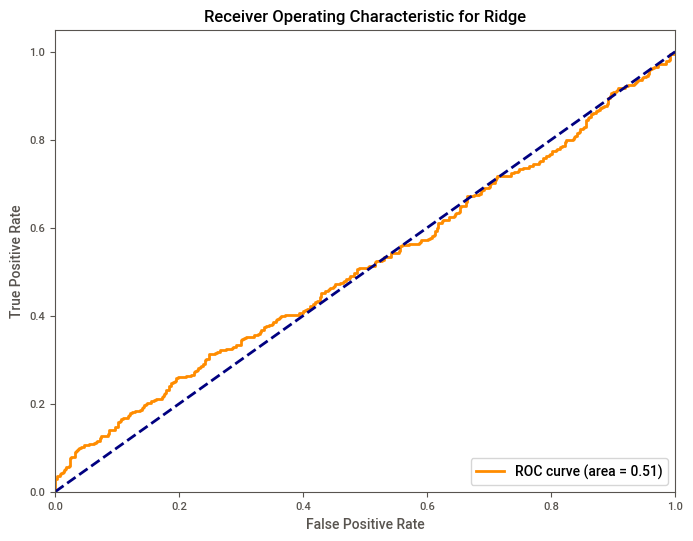

Classification Report for Ridge:

              precision    recall  f1-score   support

           0       0.61      1.00      0.76       603
           1       0.00      0.00      0.00       380

    accuracy                           0.61       983
   macro avg       0.31      0.50      0.38       983
weighted avg       0.38      0.61      0.47       983





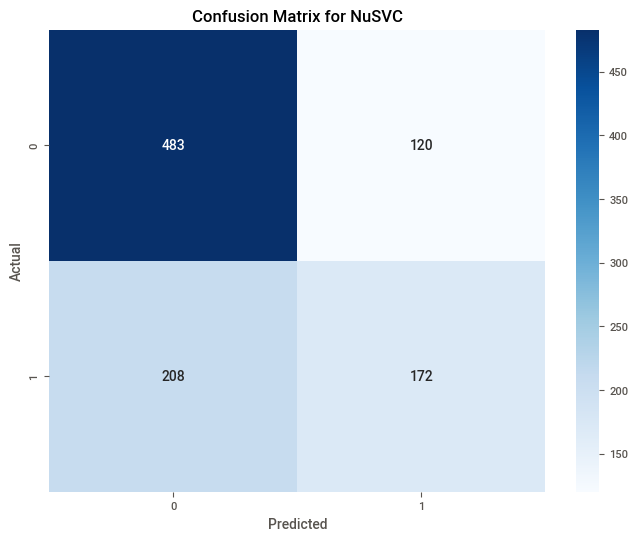

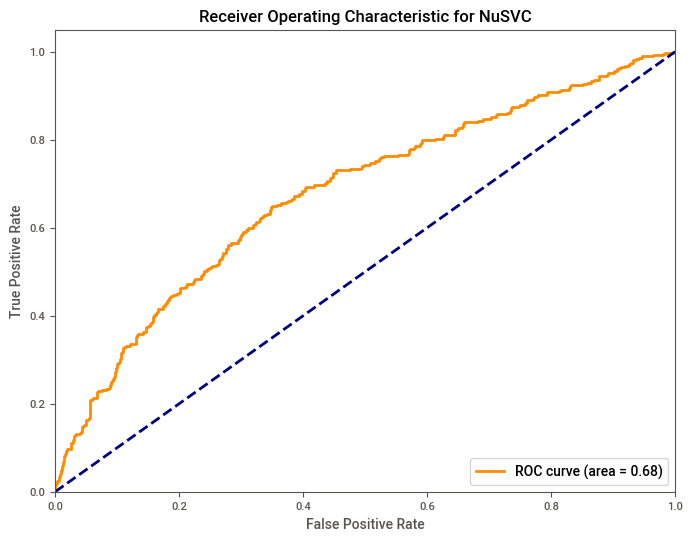

Classification Report for NuSVC:

              precision    recall  f1-score   support

           0       0.70      0.80      0.75       603
           1       0.59      0.45      0.51       380

    accuracy                           0.67       983
   macro avg       0.64      0.63      0.63       983
weighted avg       0.66      0.67      0.66       983





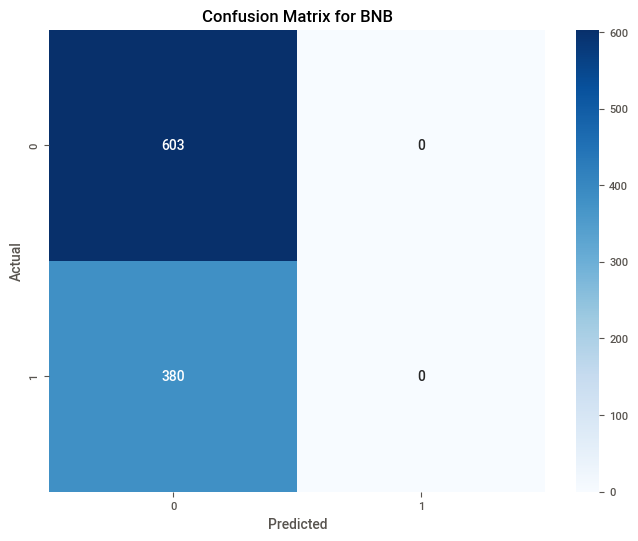

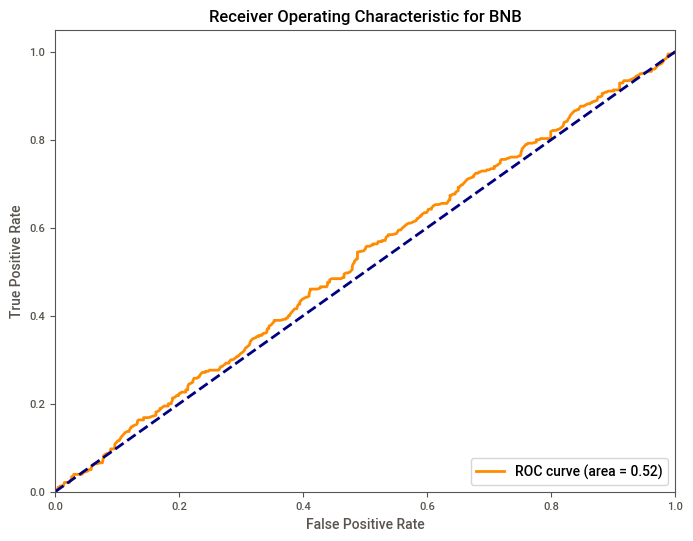

Classification Report for BNB:

              precision    recall  f1-score   support

           0       0.61      1.00      0.76       603
           1       0.00      0.00      0.00       380

    accuracy                           0.61       983
   macro avg       0.31      0.50      0.38       983
weighted avg       0.38      0.61      0.47       983





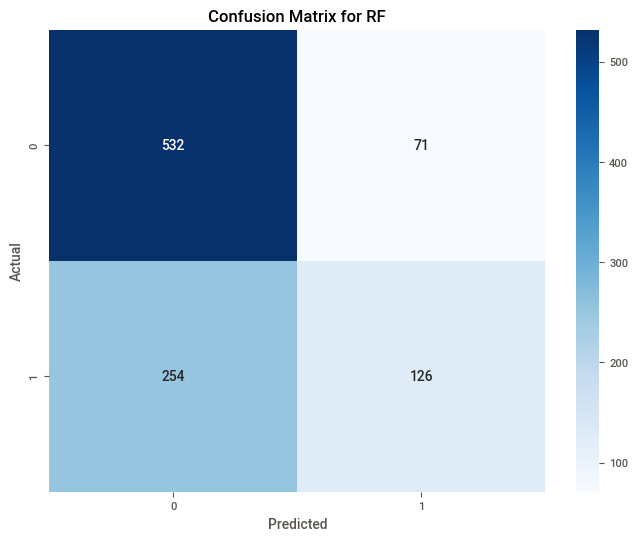

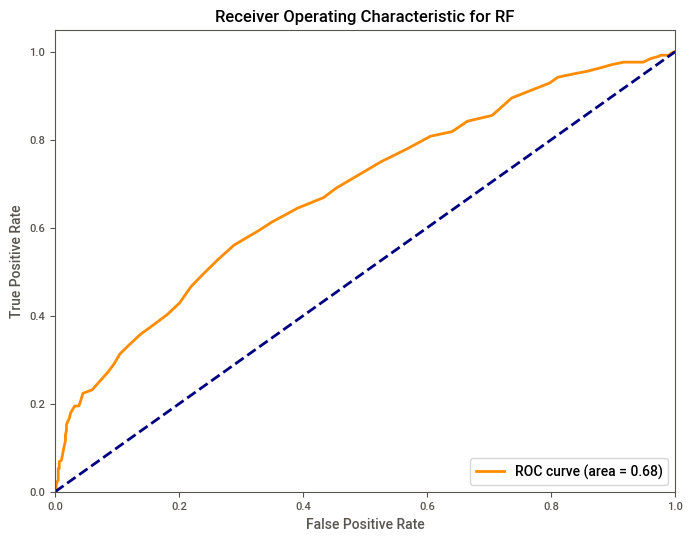

Classification Report for RF:

              precision    recall  f1-score   support

           0       0.68      0.88      0.77       603
           1       0.64      0.33      0.44       380

    accuracy                           0.67       983
   macro avg       0.66      0.61      0.60       983
weighted avg       0.66      0.67      0.64       983





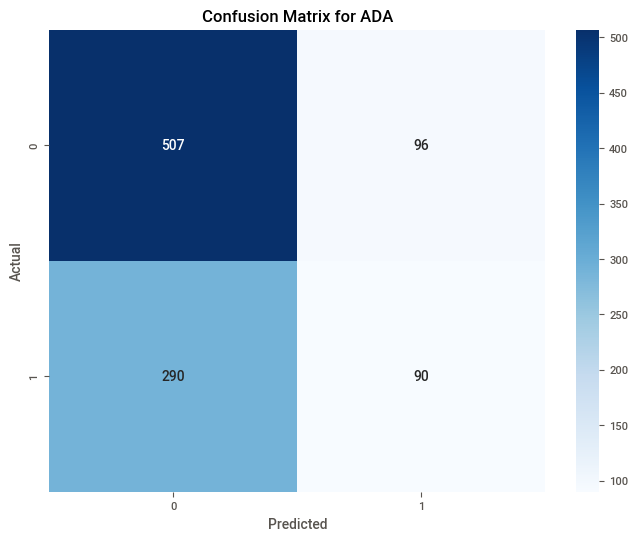

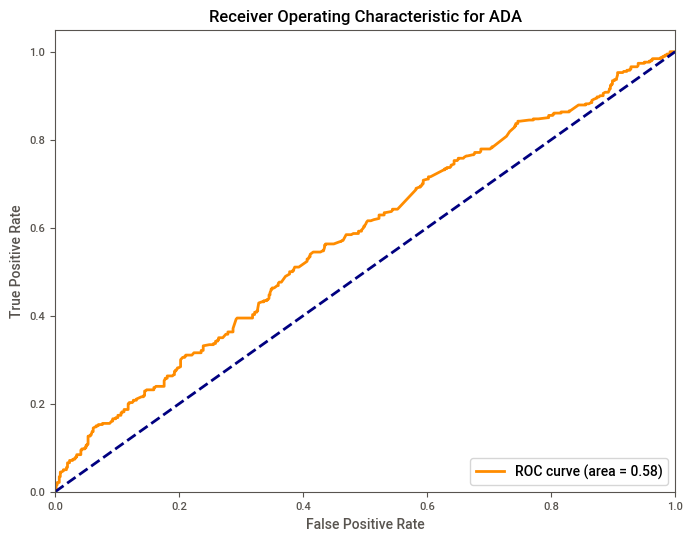

Classification Report for ADA:

              precision    recall  f1-score   support

           0       0.64      0.84      0.72       603
           1       0.48      0.24      0.32       380

    accuracy                           0.61       983
   macro avg       0.56      0.54      0.52       983
weighted avg       0.58      0.61      0.57       983





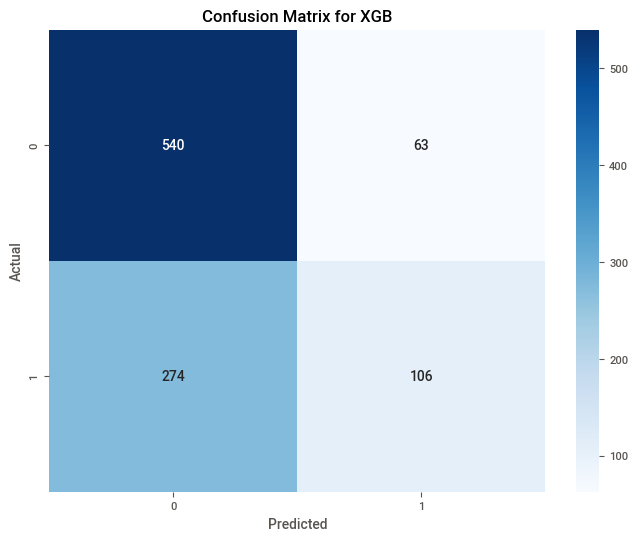

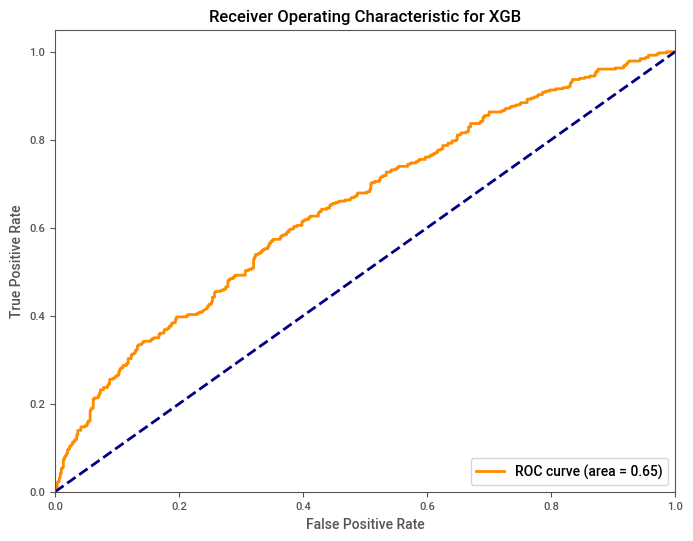

Classification Report for XGB:

              precision    recall  f1-score   support

           0       0.66      0.90      0.76       603
           1       0.63      0.28      0.39       380

    accuracy                           0.66       983
   macro avg       0.65      0.59      0.57       983
weighted avg       0.65      0.66      0.62       983





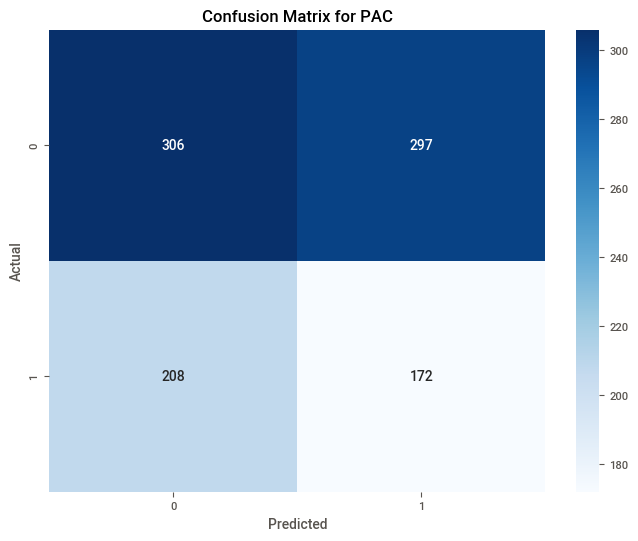

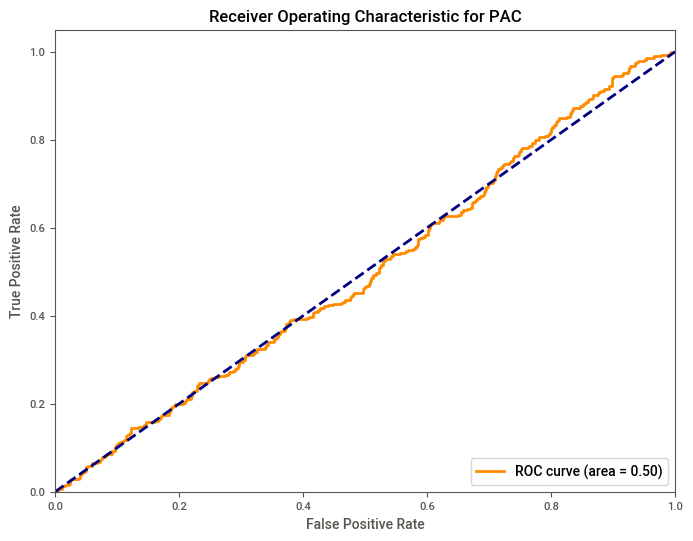

Classification Report for PAC:

              precision    recall  f1-score   support

           0       0.60      0.51      0.55       603
           1       0.37      0.45      0.41       380

    accuracy                           0.49       983
   macro avg       0.48      0.48      0.48       983
weighted avg       0.51      0.49      0.49       983





In [36]:
from sklearn.metrics import classification_report, accuracy_score

models = [
    ("LR", LogisticRegression(max_iter=1000)), ("SVC", SVC()), ('KNN', KNeighborsClassifier(n_neighbors=10)),
    ("DTC", DecisionTreeClassifier()), ("GNB", GaussianNB()), ("SGDC", SGDClassifier()), ("Perc", Perceptron()),
    ("NC", NearestCentroid()), ("Ridge", RidgeClassifier()), ("NuSVC", NuSVC()), ("BNB", BernoulliNB()),
    ('RF', RandomForestClassifier()), ('ADA', AdaBoostClassifier()), ('XGB', GradientBoostingClassifier()),
    ('PAC', PassiveAggressiveClassifier())
]

results = []
finalResults = []

def plot_confusion_matrix(cm, model_name):
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title(f'Confusion Matrix for {model_name}')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

def plot_roc_curve(fpr, tpr, roc_auc, model_name):
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'Receiver Operating Characteristic for {model_name}')
    plt.legend(loc='lower right')
    plt.show()

for name, model in models:
    model.fit(X_train, y_train)
    model_results = model.predict(X_test)
    accuracy = accuracy_score(y_test, model_results) * 100
    finalResults.append((name, accuracy))
    
    cm = confusion_matrix(y_test, model_results)
    plot_confusion_matrix(cm, name)
    
    try:
        if hasattr(model, "predict_proba"):
            y_score = model.predict_proba(X_test)[:, 1]
        else:
            y_score = model.decision_function(X_test)
        
        fpr, tpr, _ = roc_curve(y_test, y_score)
        roc_auc = auc(fpr, tpr)
        plot_roc_curve(fpr, tpr, roc_auc, name)
    except AttributeError:
        print(f"ROC curve not available for {name}")
        
    # Print classification report
    print(f"Classification Report for {name}:\n")
    print(classification_report(y_test, model_results))
    print("\n" + "="*60 + "\n")

finalResults.sort(key=lambda k: k[1], reverse=True)
results_df = pd.DataFrame(finalResults, columns=['Model', 'Accuracy Score (%)'])

In [37]:
results_df

,Model,Accuracy Score (%)
0,SVC,67.853510
1,RF,66.937945
2,NuSVC,66.632757
3,XGB,65.717192
4,KNN,63.682604
5,GNB,63.682604
6,LR,61.342828
7,Ridge,61.342828
8,BNB,61.342828
9,ADA,60.732452


In [38]:
results_df.describe()

,Accuracy Score (%)
count,15.000000
mean,60.359444
std,6.169374
min,48.626653
25%,58.189217
50%,61.342828
75%,64.699898
max,67.853510


I chose the top 5 baseline models and performed Hyperparameter tuning to it.
2 models outshined other models and they were Random Forest and XGBoost so I choose them for my final model.

<div style="background-color:#000000; color:#FFA500; font-family:Arial, sans-serif;">
    <center>Hyperparameter Tuning</center>
</div>

So now we have the best parameters for our final ensembled model.

---

<div style="background-color:#000000; color:#FFA500; font-family:Times New Roman, Times, serif; font-size:50px;">
    <center>Final Model</center>
</div>

I've used the VotingClassfier to ensemble the models for better results!

In [39]:
'''param=data['Parameters']
model = VotingClassifier(estimators=[
                                     ('SVC',SVC(**param[0])),
                                     ('RF',RandomForestClassifier(**param[1]))
                                    ],voting='hard')

accuracy=[]
scaler = StandardScaler()
skf = RepeatedStratifiedKFold(n_splits=5,n_repeats=2)
skf.get_n_splits(X,y)

for train_index, test_index in skf.split(X,y):
    
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]
    
    scaler.fit(X_train)
    X_train = scaler.transform(X_train)
    X_test = scaler.transform(X_test)
    
    model.fit(X_train,y_train)
    predictions=model.predict(X_test)
    score=accuracy_score(y_test,predictions)
    accuracy.append(score)'''

"param=data['Parameters']\nmodel = VotingClassifier(estimators=[\n                                     ('SVC',SVC(**param[0])),\n                                     ('RF',RandomForestClassifier(**param[1]))\n                                    ],voting='hard')\n\naccuracy=[]\nscaler = StandardScaler()\nskf = RepeatedStratifiedKFold(n_splits=5,n_repeats=2)\nskf.get_n_splits(X,y)\n\nfor train_index, test_index in skf.split(X,y):\n    \n    X_train, X_test = X[train_index], X[test_index]\n    y_train, y_test = y[train_index], y[test_index]\n    \n    scaler.fit(X_train)\n    X_train = scaler.transform(X_train)\n    X_test = scaler.transform(X_test)\n    \n    model.fit(X_train,y_train)\n    predictions=model.predict(X_test)\n    score=accuracy_score(y_test,predictions)\n    accuracy.append(score)"

I believe the features aren't proving much help to the model to distinguish between the 2 classes which is stopping the model to perform better.

---

<div style="background-color:#000000; color:#FFA500; font-family:Times New Roman, Times, serif; font-size:50px;">
    <center>Conclusion</center>
</div>

1. The TDS levels seem to contain some descripency since its values are on an average 40 folds more than the upper limit for safe drinking water.

2. The data contains almost equal number of acidic and basic pH level water samples.

3. 92% of the data was considered Hard. 

4. Only 2% of the water samples were safe in terms of Chloramines levels.

5. Only 1.8% of the water samples were safe in terms of Sulfate levels.

6. 90.6% of the water samples had higher Carbon levels than the typical Carbon levels in drinking water (10 ppm).

7. 76.6% of water samples were safe for drinking in terms of Trihalomethane levels in water.

8. 90.4% of the water samples were safe for drinking in terms of the Turbidity of water samples.

9. The correlation coefficients between the features were very low.

10. Random Forest and SVC worked the best to train the model.

11. The ensemble method of using the Voting Classfier on Stratified K-folded samples gave an accuracy of >67%

---

<div style="background-color:#000000; color:#FFA500; font-family:Times New Roman, Times, serif; font-size:50px;">
    <center>Thank You!</center>
</div>

<div style="background-color:#FFFFFF; color:#0904182; font-family:Times New Roman, Times, serif; font-size:50px;">
    <center>Team DaSci'24</center>
</div>